In [4]:
# cell 1
%matplotlib inline
import cv2
from PIL import Image
import imutils
import csv
import re
import numpy as np
import matplotlib
from plantcv import plantcv as pcv

pcv.params.debug = 'plot'                     # Plot debug images to the notebook

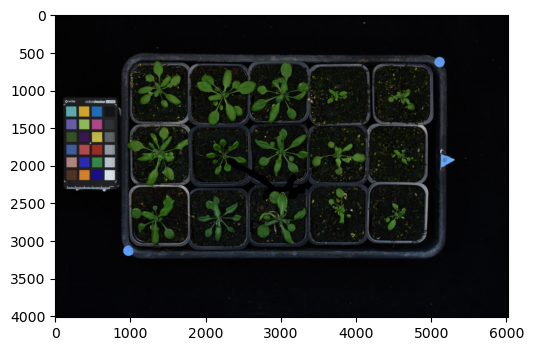

In [5]:
# cell 2
### Main pipeline

# Read image
img, path, filename = pcv.readimage("/data/PhD/Phenotyping/2021-07_Emma/Top/26_5.JPG")    
# Read ref image
# ref_img, ref_path, ref_filename = pcv.readimage("/home/leonard/Documents/Uni/PhD/Phenotyping/2020-05_lac11_segregating/33_3.jpg")

In [6]:
%%capture
# cell 3

#df, start, space = pcv.transform.find_color_card(rgb_img=ref_img)
#ref_mask = pcv.transform.create_color_card_mask(rgb_img=ref_img, radius=10, start_coord=start, spacing=space, ncols=4, nrows=6,
                                                #exclude=[1,21,23]
#                                               )

df, start, space = pcv.transform.find_color_card(rgb_img=img)
img_mask = pcv.transform.create_color_card_mask(rgb_img=img, radius=10, start_coord=start, spacing=space, ncols=4, nrows=6,
                                                #exclude=[1,21,23]
                                               )

#output_directory = "."

# correct colour
#target_matrix, source_matrix, transformation_matrix, corrected_img = pcv.transform.correct_color(ref_img, ref_mask, img, img_mask, output_directory)

In [7]:
# cell 4
# check that the colour correction worked (source~target should be strictly linear)
#pcv.transform.quick_color_check(source_matrix = source_matrix, target_matrix = target_matrix, num_chips = 24)
#pcv.print_image(img_mask, "img_mask.png")
#pcv.print_image(ref_mask, "ref_mask.png")
#pcv.print_image(corrected_img, "corrected_img.png")

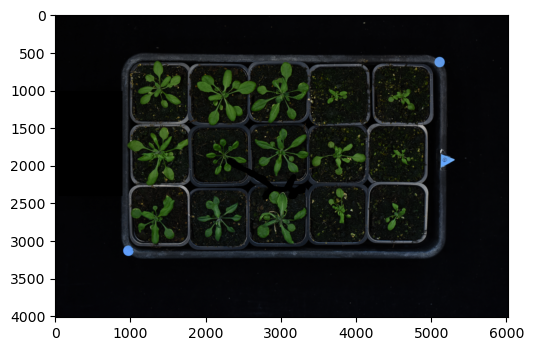

In [8]:
# cell 5
# write the spacing of the colour card to file as size marker   
with open(r'size_marker.csv', 'a') as f:
    writer = csv.writer(f)
    writer.writerow([filename, space[0]])

# define a bounding rectangle around the colour card
x_cc,y_cc,w_cc,h_cc = cv2.boundingRect(img_mask)
x_cc = int(round(x_cc - 0.3 * w_cc))
y_cc = int(round(y_cc - 0.3 * h_cc))
h_cc = int(round(h_cc * 1.6))
w_cc = int(round(w_cc * 1.6))

# crop out colour card
start_point = (x_cc, y_cc)
end_point = (x_cc+w_cc, y_cc+h_cc)
colour = (0, 0, 0)
thickness = -1
card_crop_img = cv2.rectangle(img, start_point, end_point, colour, thickness)

pcv.plot_image(card_crop_img)

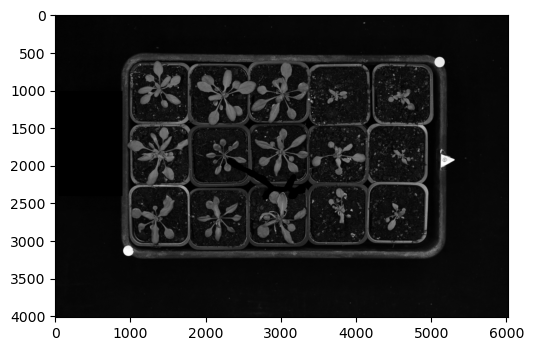

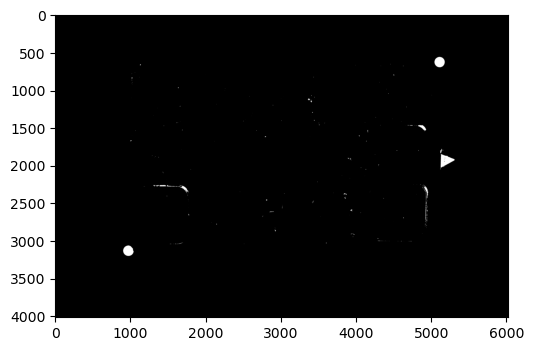

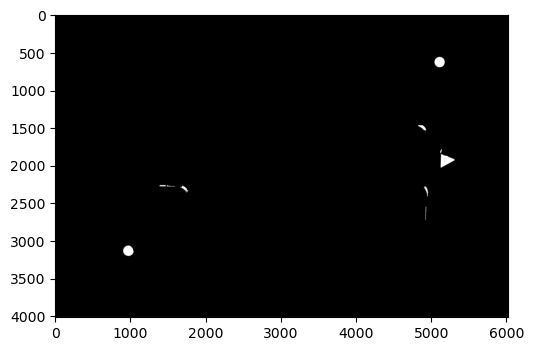

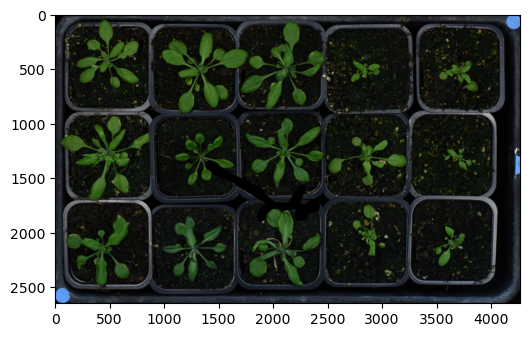

In [9]:
# cell 6
# Crop tray
# Convert RGB to HSV and extract the value channel
v = pcv.rgb2gray_hsv(card_crop_img, "v")
    
# Threshold the value image  
v_thresh = pcv.threshold.binary(v, 150, 255, "light")
    
# Fill out bright imperfections
v_thresh = pcv.fill(v_thresh, 500)
   
# Extract bounding rectangle of bright spots
x,y,w,h = cv2.boundingRect(v_thresh)

# Crop image to bounding rectangle
crop_img = card_crop_img[y:y+h, x:x+int(w - (w * 0.03))]

pcv.plot_image(crop_img)  

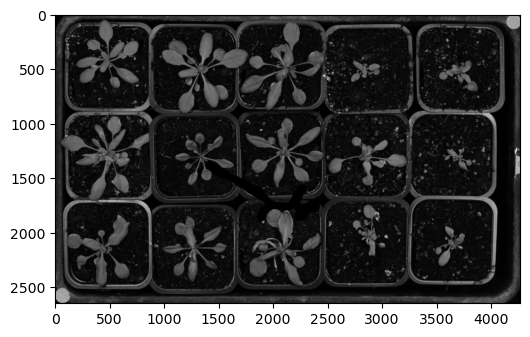

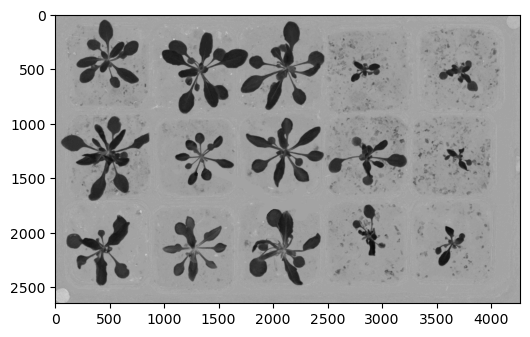

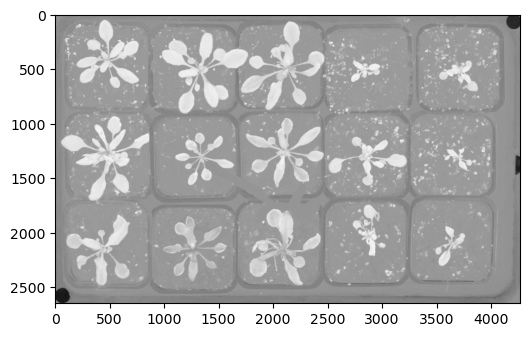

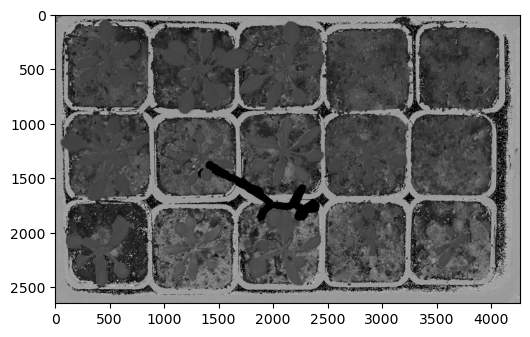

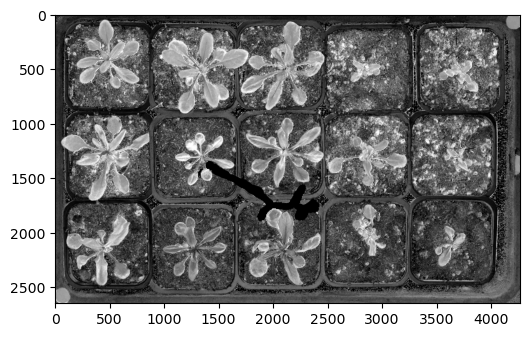

In [10]:
# cell 7
# Convert RGB to LAB and extract the Green-Magenta and Blue-Yellow channels
l = pcv.rgb2gray_lab(crop_img, "l")
a = pcv.rgb2gray_lab(crop_img, "a")
b = pcv.rgb2gray_lab(crop_img, "b")
h = pcv.rgb2gray_hsv(crop_img, "h")
s = pcv.rgb2gray_hsv(crop_img, "s")

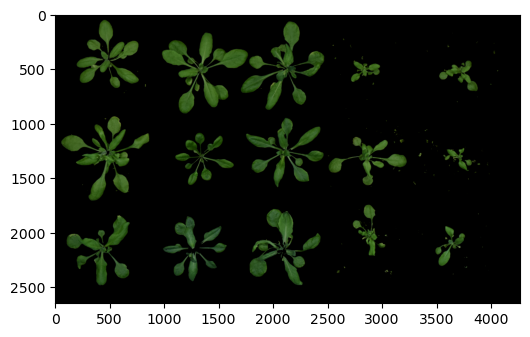

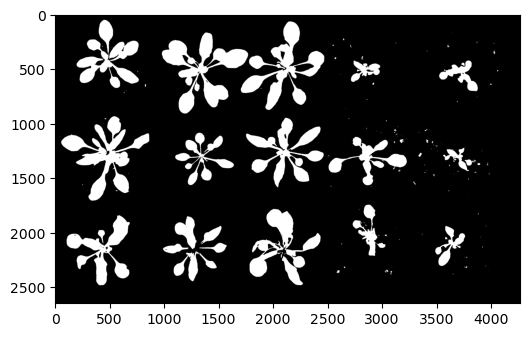

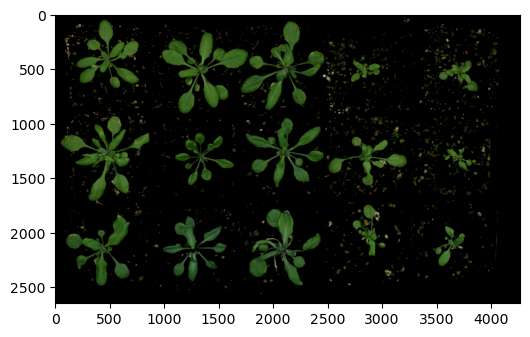

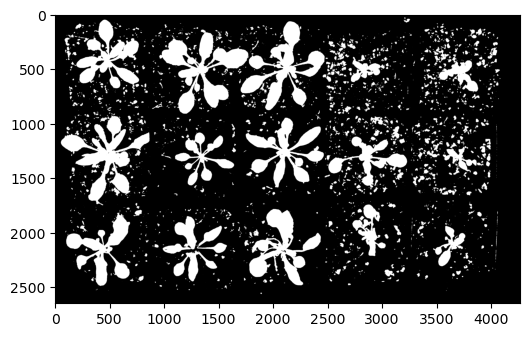

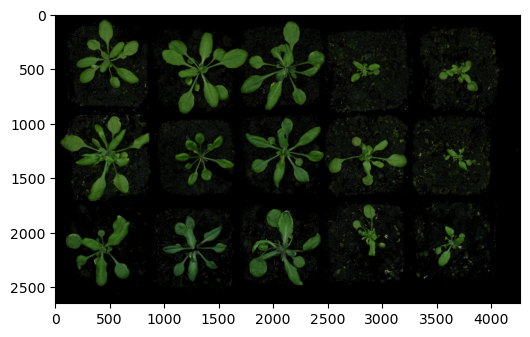

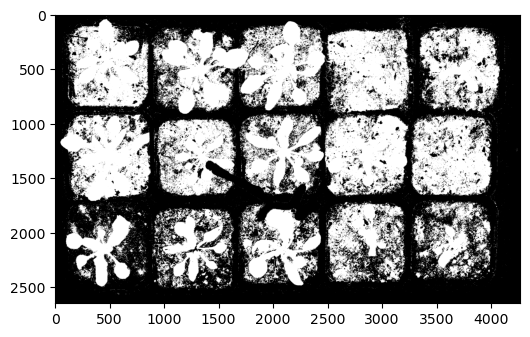

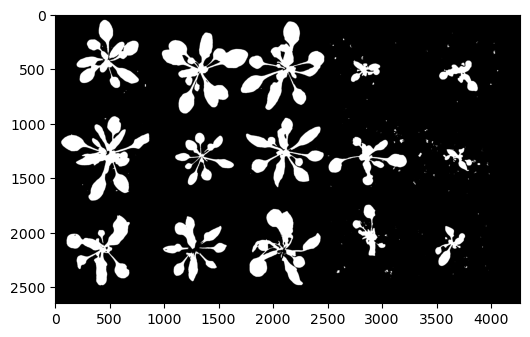

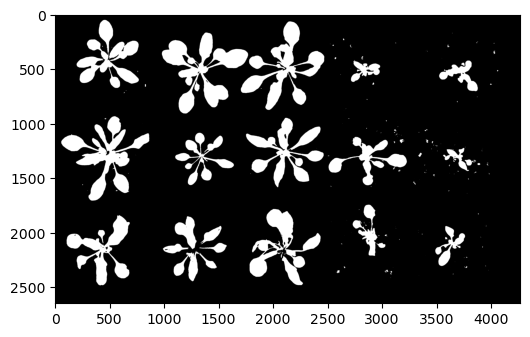

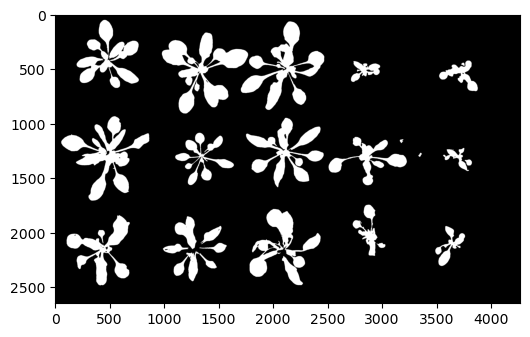

500


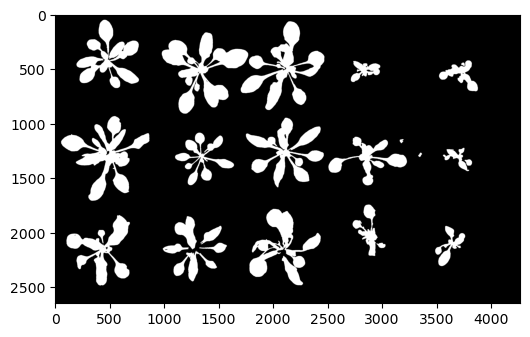

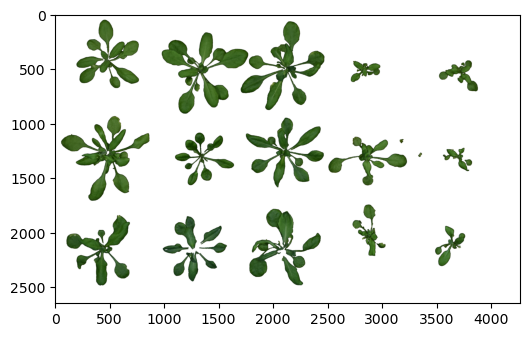

In [11]:
# cell 8
# Threshold A and B channels of the LAB colourspace and the Hue channel of the HSV colourspace
a_thresh, _ = pcv.threshold.custom_range(img=crop_img, lower_thresh=[0,0,0], upper_thresh=[255,113,255], channel='LAB')
b_thresh, _ = pcv.threshold.custom_range(img=crop_img, lower_thresh=[0,0,135], upper_thresh=[255,255,255], channel='LAB')
h_thresh, _ = pcv.threshold.custom_range(img=crop_img, lower_thresh=[35,0,0], upper_thresh=[70,255,255], channel='HSV')

# Join the thresholded images to keep only consensus pixels
ab = pcv.logical_and(b_thresh, a_thresh)
abh = pcv.logical_and(ab, h_thresh)

# Fill small objects depending on expected plant size based on DPG
match = re.search("(\d+).(\d)\.JPG$", filename)

if int(match.group(1)) < 10:
    abh_clean = pcv.fill(abh, 50)
    print("50")
elif int(match.group(1)) < 15:
    abh_clean = pcv.fill(abh, 200)
    print("200")
else:
    abh_clean = pcv.fill(abh, 500)
    print("500")

# Dilate to close broken borders
abh_dilated = pcv.dilate(abh_clean, 3, 1)

# Close holes
# abh_fill = pcv.fill_holes(abh_dilated)
abh_fill = abh_dilated

# Apply mask (for VIS images, mask_color=white)
masked = pcv.apply_mask(crop_img, abh_fill, "white")

# Detect, dilate to close, and fill edges
#edges = pcv.canny_edge_detect(masked, thickness = 5, sigma = 11)
#edges_dilated = pcv.dilate(edges, 50, 1)
#edges_fill = pcv.fill_holes(edges_dilated)

#abh_fill = pcv.logical_and(abh_fill, edges_fill)

# Apply mask (for VIS images, mask_color=white)
#masked = pcv.apply_mask(crop_img, abh_fill, "white")

pcv.print_image(masked, "dilated.png")

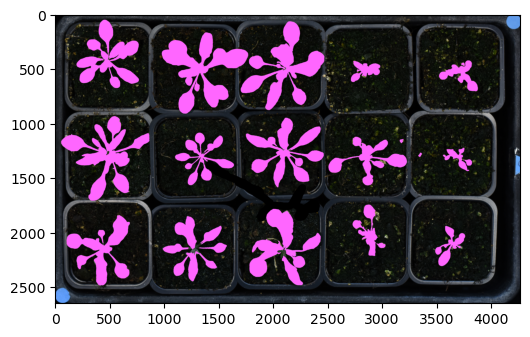

In [12]:
# cell 9
# Find objects (contours: black-white boundaries)
# Inputs:
#    img  = image that the objects will be overlayed
#    mask = what is used for object detection

id_objects, obj_hierarchy = pcv.find_objects(crop_img, abh_fill)

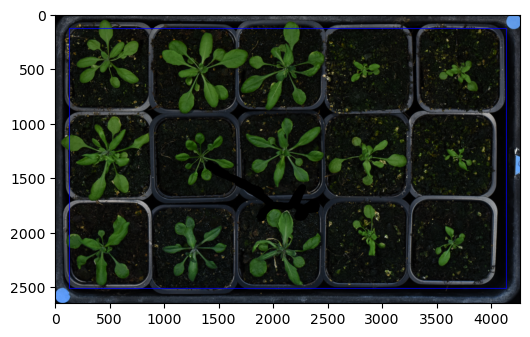

In [13]:
# cell 10
# Define region of interest (ROI)
# Inputs:
#    x     = The x-coordinate of the upper left corner of the rectangle.
#    y     = The y-coordinate of the upper left corner of the rectangle.
#    w     = The height of the rectangle.
#    h     = The width of the rectangle.
#    img   = An RGB or grayscale image to plot the ROI on.
#    roi_contour, roi_hierarchy = pcv.roi.rectangle(5, 90, 200, 390, img1)                                                ^                ^
#                                                  |______________|
#                                            adjust these four values

# Define the ROI as a rectangle realtive to image size, covering 90% of the width and 80% of the height
roi_y = 0 + crop_img.shape[0] * 0.05
roi_x = 0 + crop_img.shape[0] * 0.05
roi_h = crop_img.shape[0] - (crop_img.shape[0] * 0.1)
roi_w = crop_img.shape[1] - (crop_img.shape[0] * 0.1)
roi_contour, roi_hierarchy = pcv.roi.rectangle(crop_img, roi_y, roi_x, roi_h, roi_w)

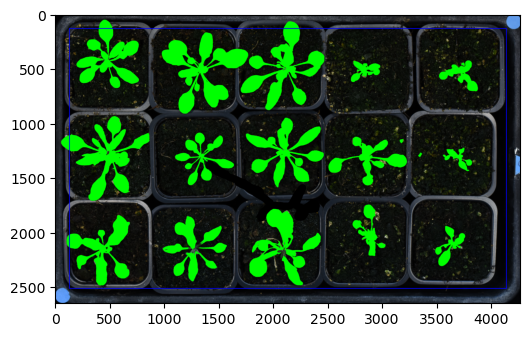

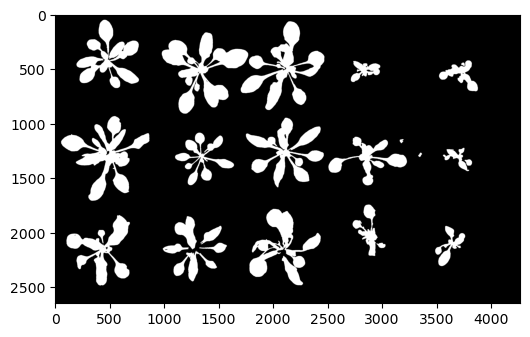

In [14]:
# cell 11
# Keep objects that overlap with the ROI
# Inputs:
#    img            = img to display kept objects
#    roi_type       = 'cutto' or 'partial' (for partially inside)
#    roi_contour    = contour of roi, output from "View and Ajust ROI" function
#    roi_hierarchy  = contour of roi, output from "View and Ajust ROI" function
#    object_contour = contours of objects, output from "Identifying Objects" fuction
#    obj_hierarchy  = hierarchy of objects, output from "Identifying Objects" fuction

roi_objects, roi_obj_hierarchy, kept_mask, obj_area = pcv.roi_objects(img = crop_img, 
                                                                      roi_type = 'partial', 
                                                                      roi_contour = roi_contour,
                                                                      roi_hierarchy = roi_hierarchy, 
                                                                      object_contour = id_objects, 
                                                                      obj_hierarchy = obj_hierarchy)

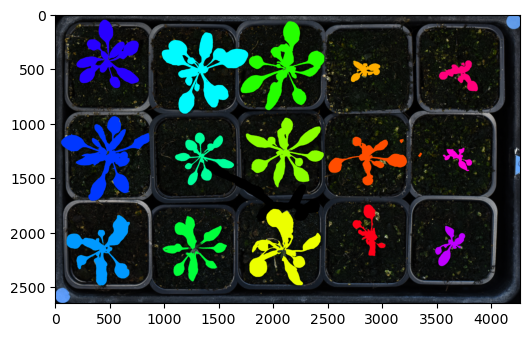

In [15]:
# cell 12
# This function take a image with multiple contours and
# clusters them based on user input of rows and columns

# Inputs:
#    img               = An RGB image
#    roi_objects       = object contours in an image that are needed to be clustered.
#    roi_obj_hierarchy = object hierarchy
#    nrow              = number of rows to cluster (this should be the approximate  number of desired rows in the entire image even if there isn't a literal row of plants)
#    ncol              = number of columns to cluster (this should be the approximate number of desired columns in the entire image even if there isn't a literal row of plants)

clusters, contours, hierarchies = pcv.cluster_contours(
    crop_img, roi_objects, roi_obj_hierarchy, 3, 5)

In [16]:
%%capture
# cell 13
# This #function takes clustered contours and splits them into multiple images,
# also does a check to make sure that the number of inputted filenames matches the number
# of clustered contours. If no filenames are given then the objects are just numbered
# Inputs:
#    img                     = ideally a masked RGB image.
#    grouped_contour_indexes = output of cluster_contours, indexes of clusters of contours
#    contours                = contours to cluster, output of cluster_contours
#    hierarchy               = object hierarchy
#    outdir                  = directory for output images
#    file                    = the name of the input image to use as a base name , output of filename from read_image function
#    filenames               = input txt file with list of filenames in order from top to bottom left to right (likely list of genotypes)

# Set global debug behavior to None (default), "print" (to file), or "plot" (Jupyter Notebooks or X11)
# Un-comment the line below to see the split up contours print to the output directory 
#pcv.params.debug = "print"

#out = args.outdir

# If you have a list of treatments, genotypes, etc. You would input a .txt file with them to help save
# the contours by names, add it to the options class and then add filenames=names to the 
# splitimg function below.  
#names = args.names

output_path, imgs, masks = pcv.cluster_contour_splitimg(crop_img, clusters, contours, 
                                           hierarchies, ".", file=filename)

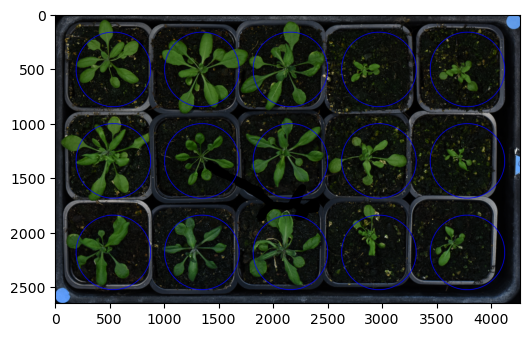

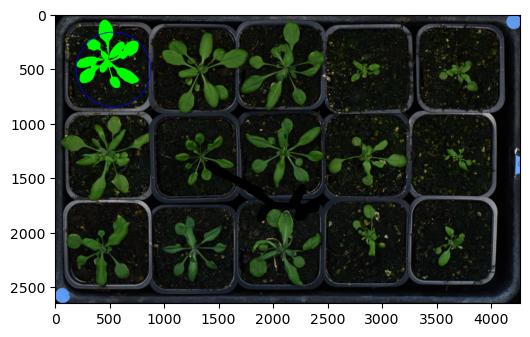

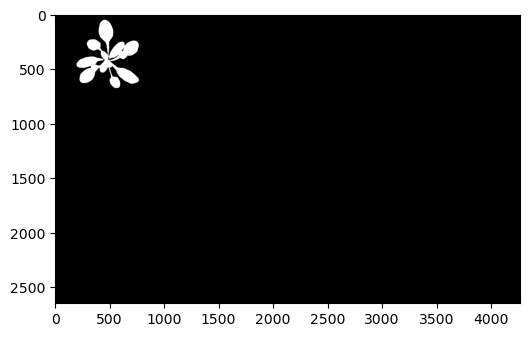

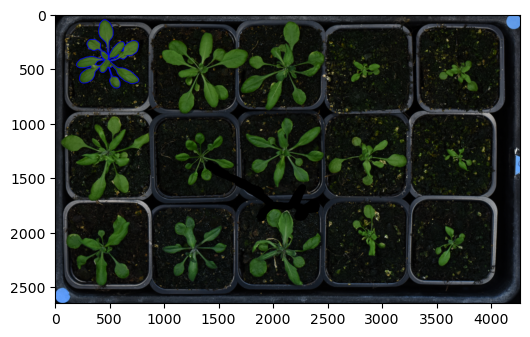

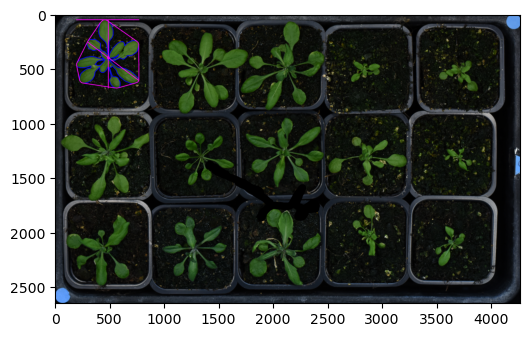

...

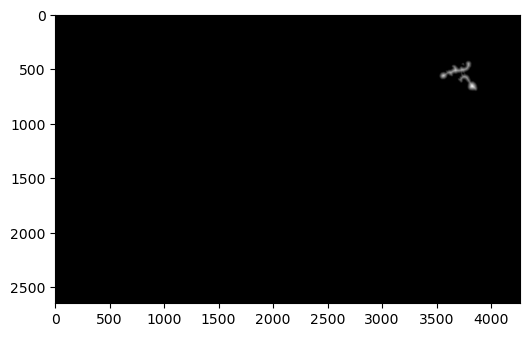

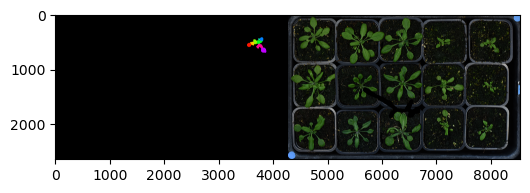

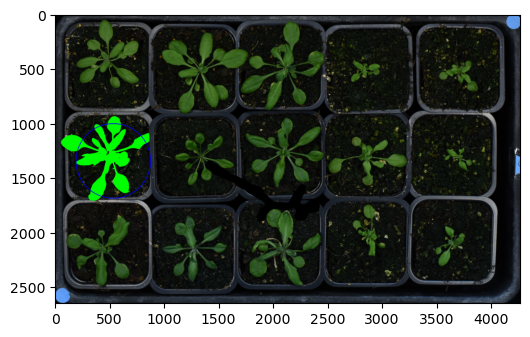

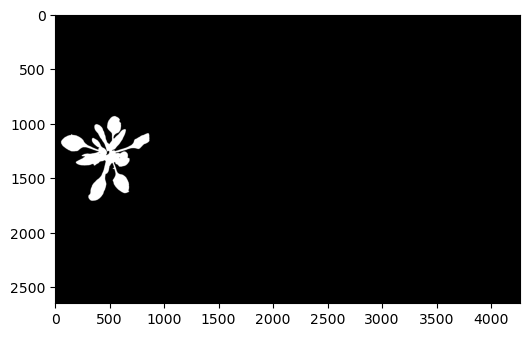

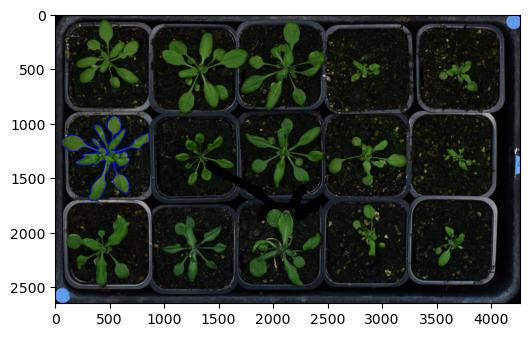

KeyboardInterrupt: 

In [17]:
# cell 14
# Approximate the position of the top left plant as grid start
coord_y = int(round(((crop_img.shape[0] / 3) * 0.5) + (crop_img.shape[0] * 0.025)))
coord_x = int(round(((crop_img.shape[1] / 5) * 0.5) + (crop_img.shape[1] * 0.025)))

# Set the ROI spacing relative to image width
spc_y = int((round(crop_img.shape[0] - (crop_img.shape[0] * 0.05)) / 3))
spc_x = int((round(crop_img.shape[1] - (crop_img.shape[1] * 0.05)) / 5))
# Set the ROI radius relative to image width
r = int(round(crop_img.shape[1] / 12.5))

# Make a grid of ROIs at the positions plants are expected
# This allows for gaps due to dead/not germinated plants, without messing up the plant numbering
imgs, masks = pcv.roi.multi(img=crop_img, nrows=3, ncols=5, coord=(coord_x, coord_y), radius=r, spacing=(spc_x, spc_y))

# Loop through the ROIs in the grid
for i in range(0, len(imgs)):
    # Find objects within the ROI
    filtered_contours, filtered_hierarchy, filtered_mask, filtered_area = pcv.roi_objects(
        img=crop_img, roi_type="partial", roi_contour=imgs[i], roi_hierarchy=masks[i], object_contour=id_objects, 
        obj_hierarchy=obj_hierarchy)
    # Analyse if not empty
    if len(filtered_contours) > 0:
        # Combine objects together in each plant     
        plant_contour, plant_mask = pcv.object_composition(img=crop_img, contours=filtered_contours, hierarchy=filtered_hierarchy)
        
        # Analyze the shape of each plant 
        analysis_images = pcv.analyze_object(img=crop_img, obj=plant_contour, mask=plant_mask)

        # Determine color properties
        color_images = pcv.analyze_color(crop_img, plant_mask, "hsv")

        # Watershed plant area to count leaves
        watershed_images = pcv.watershed_segmentation(crop_img, plant_mask, 15)

        # Print out a .json file with the analysis data for the plant
        pcv.outputs.save_results(filename = filename + "_" + str(i) + '.json')
        
        # Clear the measurements stored globally into the Ouptuts class
        pcv.outputs.clear()
            